In [1]:
import pandas as pd
import numpy as np
import glob
import re
import time

import scipy.stats as stats
import statsmodels.api as sm
import statsmodels.formula.api as smf



from sklearn.preprocessing import StandardScaler, RobustScaler, Normalizer, MinMaxScaler
from sklearn.inspection import permutation_importance
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error


from sklearn.svm import SVR
from sklearn.linear_model import SGDRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from sklearn import tree
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import cross_val_score, KFold

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import optimizers, layers


from io import StringIO
from IPython.display import Image  
import pydotplus



import matplotlib.pyplot as plt
import matplotlib
from matplotlib.patches import Patch
import seaborn as sns


plt.style.use('ggplot')
%matplotlib inline

## Πρώτα βήματα

- Αρχικά θα διαβάσουμε τα δεδομένα τα οποία έχουμε ήδη συλλέξει και αναλύσει (δες σημειωματάρια 1 & 2).


- Στη συνέχεια θα τα χωρίσουμε σε δεδομένα εκπαίδευσης και ελέγχου.


- Θα ορίσουμε έναν κανονικοποιητή για τις περιπτώσεις όπου η χρήση του είναι επιβεβλήμένη.


- Θα ορίσουμε κάποιες συναρτήσεις που θα μας βοηθήσουν στην οπτικοποίηση των δεδομένων.

In [2]:
train_data = pd.read_csv('train_data.csv')
train_data = train_data.drop(columns=['type', 'song_id', 'uri',
                                     'track_href', 'analysis_url'], axis=1)

In [3]:
# Split data for training/testing
X = train_data.drop(['valence'], axis=1)
y = train_data['valence']

X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.25,
                                                    random_state=1234)


# Pick a scaler
scaler = MinMaxScaler()

# Train the scaler...
scaler.fit(X_train)

#...and apply to original data
X_train_scaled = scaler.transform(X_train)
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)

X_test_scaled = scaler.transform(X_test)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

In [4]:
# Create a custom plotter
def summary_plotter(
    yPredictData, yPredictName='valence',
    xTrain=X_train, yTrain=y_train,
    xTest=X_test, yTest=y_test,
    ps=10, ls=30, ts=25,
    show_train=True, show_test=True, show_legend=True):
    
    '''Args:
    
        yPredictData:            Predicted target data from a fitted model.
        
        yPredictName:            Target's name.
        
        xTrain, yTrain:          x- and y-data from the training dataset. 
        
        xTest, yTest:            x- and y-data from the testing datatest.
        
        show_train, show_test:   Display the training and testing 
                                 dataset respectively.
        
        -----
        ps:      Size of data points in scatter plots.
        ls:      Size of x- and y-labels.
        ts:      Size of major ticks. 
    '''
    
    
    legend_labels = [
        Patch(facecolor='k', label='Train data'),
        Patch(facecolor='b', label='Test data'),
        Patch(facecolor='orange', label='Predict data')
    ]
    
    fig, ax = plt.subplots(ncols=2,
                           nrows=7,
                           figsize=(27.5, 25.5)
    )
    
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.3, hspace=0.5)
    
    if show_legend:
        plt.legend(
            handles=legend_labels,
            prop={'size': 30},
            ncol=3,
            bbox_to_anchor=(-0.2, 10.3),
            loc="center"
        )
    
    # Dummy index for column to plot
    k=0
    for i in range(7):
        for j in range(2):
            try:
                if show_train and not show_test:
                    ax[i,j].tick_params(axis='both', which='major', labelsize=ts)
                    ax[i,j].scatter(xTrain.iloc[:,k], yTrain, s=ps, c='k')
                    ax[i,j].scatter(xTest.iloc[:,k], yPredictData, s=ps, c='orange')
                    ax[i,j].set_xlabel(xTrain.columns[k],size=ls)
                    ax[i,j].set_ylabel(yPredictName, size=ls)
                    k+=1
                elif show_test and not show_train:
                    ax[i,j].tick_params(axis='both', which='major', labelsize=ts)
                    ax[i,j].scatter(xTest.iloc[:,k], yTest, s=ps, c='b')
                    ax[i,j].scatter(xTest.iloc[:,k], yPredictData, s=ps, c='orange')
                    ax[i,j].set_xlabel(xTrain.columns[k],size=ls)
                    ax[i,j].set_ylabel(yPredictName, size=ls)
                    k+=1
                elif (not show_train) and (not show_test):
                    ax[i,j].tick_params(axis='both', which='major', labelsize=ts)
                    ax[i,j].scatter(xTest.iloc[:,k], yPredictData, s=ps, c='orange')
                    ax[i,j].set_xlabel(xTrain.columns[k],size=ls)
                    ax[i,j].set_ylabel(yPredictName, size=ls)
                    k+=1
                else:
                    ax[i,j].tick_params(axis='both', which='major', labelsize=ts)
                    ax[i,j].scatter(xTrain.iloc[:,k], yTrain, s=ps, c='k')
                    ax[i,j].scatter(xTest.iloc[:,k], yTest, s=ps, c='b')
                    ax[i,j].scatter(xTest.iloc[:,k], yPredictData, s=ps, c='orange')
                    ax[i,j].set_xlabel(xTrain.columns[k],size=ls)
                    ax[i,j].set_ylabel(yPredictName, size=ls)
                    k+=1
                    
            except IndexError: break
    
    x_ax = range(len(xTest))
    ax[6,0].tick_params(axis='both', which='major', labelsize=ts)
    ax[6,0].set_xlabel('X data', size=ls)
    ax[6,0].set_ylabel('valence', size=ls)
    ax[6,0].scatter(x_ax, yTest, s=ps, c='b')
    ax[6,0].scatter(x_ax, yPredictData, s=ps, c='orange')
    ax[6,1].axis('off')

In [5]:
def plot_loss(history):
    plt.figure(figsize=(10,8))
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.xlabel('Epoch')
    plt.ylabel('Error')
    plt.legend()
    plt.grid(True)

# <center>Ε1: Πρόβλεψη Σθένους άνευ Νευρωνικών Δικτύων<center>

## Decission Trees and Random Forest

- Θα ξεκινήσουμε με ένα απλό δέντρο αποφάσεων καθώς η εκπαίδευσή του δεν απαιτεί κανονικοποίηση των δεδομένων.


- Αρχικά θα εκπαιδεύσουμε ένα μόνο δέντρο για να έχουμε μία καλύτερη αντίληψη του πως δουλεύει η διαδικασία της εκπαίδευσης και στη συνέχεια, αν κριθεί απαραίτητο, θα καταφύγουμε σε πιο πολύπλοκες λύσεις.

In [6]:
# Start with a single tree
single_tree = DecisionTreeRegressor(max_depth=2, criterion='squared_error')
tree_predict = single_tree.fit(X_train, y_train)
predicted_valence_w_tree = single_tree.predict(X_test)

In [7]:
print('MAE:', mean_absolute_error(y_test, predicted_valence_w_tree))
print('mean:', predicted_valence_w_tree.mean())
print('std:', predicted_valence_w_tree.std())

MAE: 0.16396641922793964
mean: 0.5048121414767718
std: 0.07958895533728044


In [8]:
plt.figure(figsize=(28,30))
dot_data = StringIO()  
tree.export_graphviz(single_tree, out_file=dot_data,  
                     feature_names=train_data.drop('valence',axis=1).columns[:],  
                     filled=True, rounded=True,  
                     special_characters=True)  
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())

<Figure size 2016x2160 with 0 Axes>

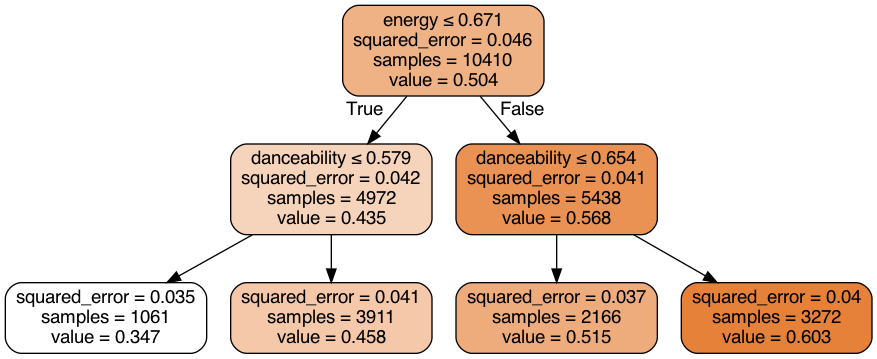

In [9]:
Image(graph.create_png())
# print(len(pd.Series(predicted_valence_w_tree).unique()))

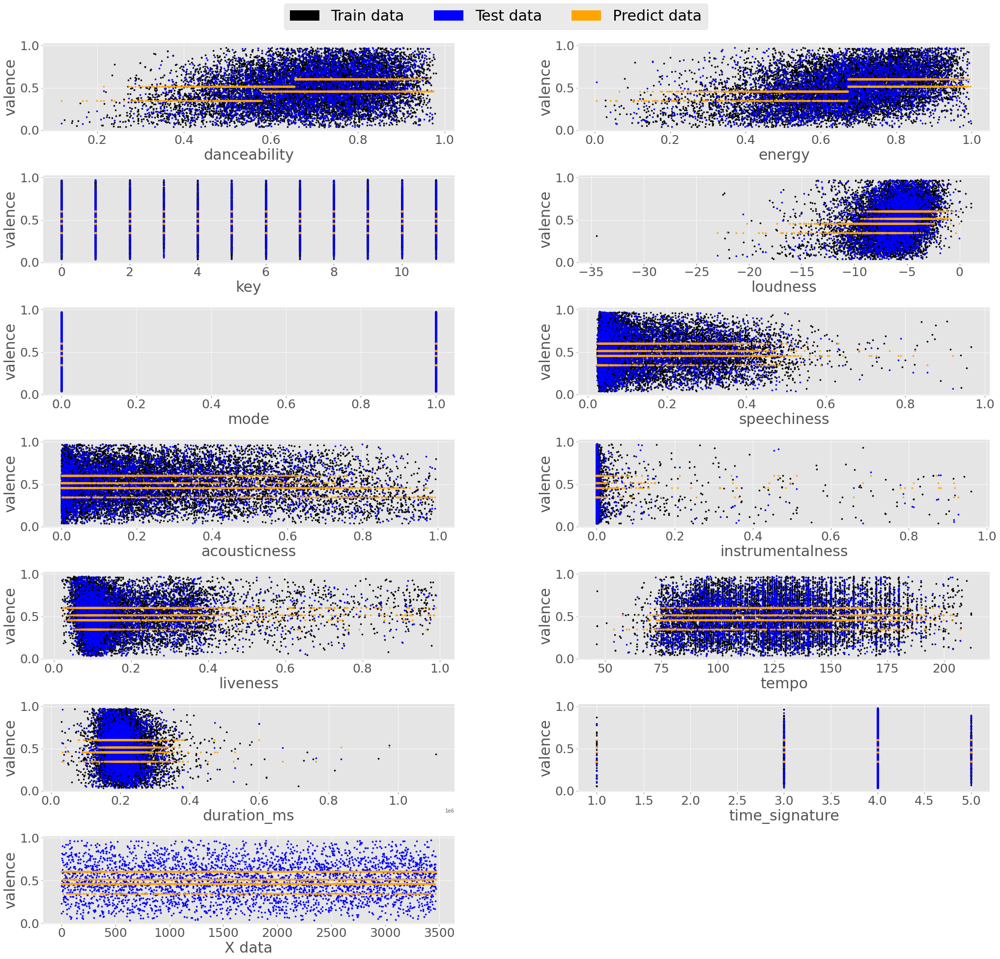

In [10]:
summary_plotter(yPredictData=predicted_valence_w_tree)

- Παρατηρούμε ότι στο συγκεκριμένο δέντρο με ``max_depth=2``, το μοντέλο μας προβλέπει 4 διαφορετικές τιμές για το σθένος των κομματιών, όσες δηλαδή και τα φύλλα του.



- Θα αναζητήσουμε το βέλτιστο αριθμό για το βάθος του δέντρου.

In [11]:
single_tree_grid_param = {
    'max_depth': [int(x) for x in np.linspace(1, 100, 25)]
}

start_time = time.time()
single_tree = DecisionTreeRegressor(criterion='squared_error')
single_tree_grid_search = GridSearchCV(single_tree,
                                      param_grid=single_tree_grid_param,
                                      scoring='neg_mean_absolute_error',
                                      n_jobs=-1)

single_tree_grid_search.fit(X_train, y_train)
print('Time elapsed: %.2f seconds' % (time.time() - start_time))

Time elapsed: 9.38 seconds


In [12]:
print(single_tree_grid_search.best_params_)
print('\n')
print(single_tree_grid_search.best_estimator_)
print('\n')
print('Best score:', single_tree_grid_search.best_score_)

{'max_depth': 5}


DecisionTreeRegressor(max_depth=5)


Best score: -0.1572538847165786


In [13]:
# Update the model with the best parameters
single_tree.set_params(**single_tree_grid_search.best_params_, criterion='squared_error')

tree_predict = single_tree.fit(X_train, y_train)
predicted_valence_w_tree = single_tree.predict(X_test)

score = single_tree.score(X_train, y_train)
print("R-squared:", score)

mae = mean_absolute_error(y_test, predicted_valence_w_tree)
print("MAE: ", mae)

R-squared: 0.2366185829571288
MAE:  0.1574551375192278


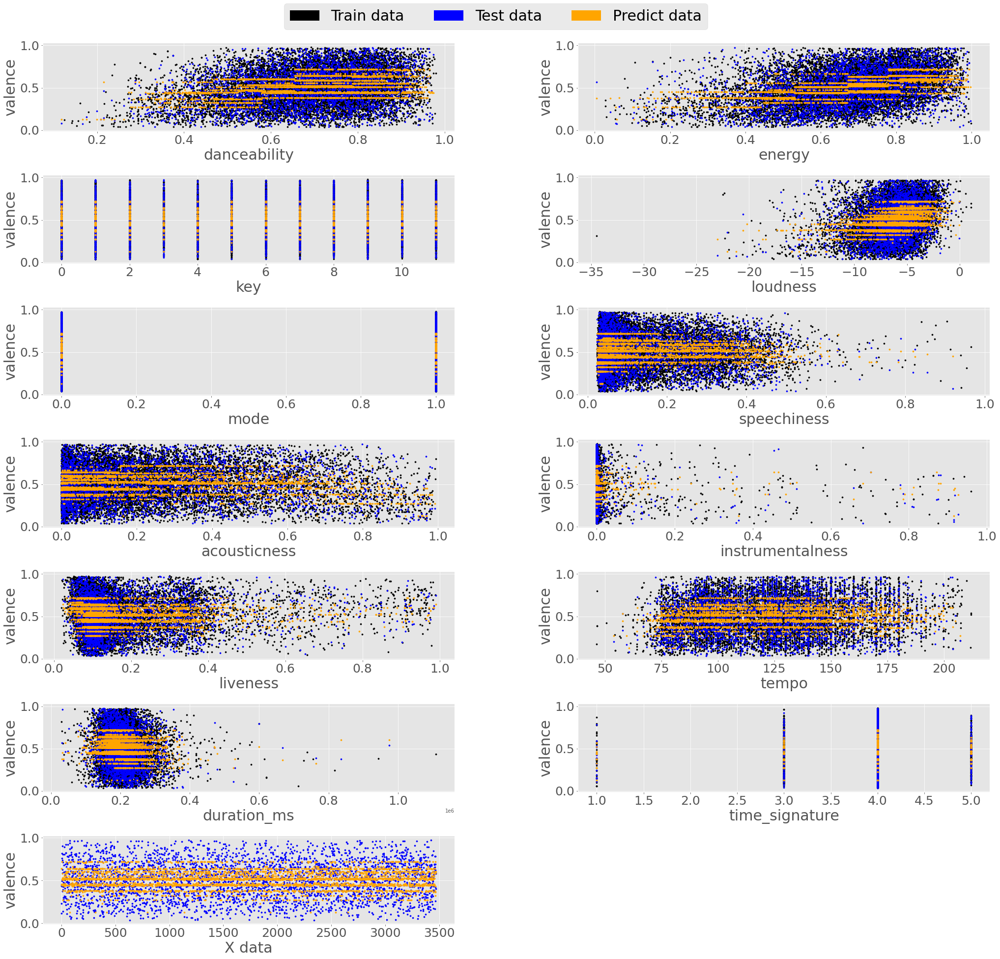

In [14]:
summary_plotter(predicted_valence_w_tree)

- Βλέπουμε ότι η κατάσταση βελτιώθηκε σημαντικά αλλά το αποτέλεσμα δεν είναι το καλύτερο. Γι' αυτό το λόγο θα προχωρήσουμε στη κατασκευή ενός Random Forest.


- Θα αναζητήσουμε τις βέλτιστες τιμές υπερπαραμέτρων χρησιμοποιώντας στοχαστική αναζήτηση.

In [15]:
# Parameter space for random forest
forest_param_grid = {
    "n_estimators": [25, 50, 75, 100],
    "max_depth": np.linspace(3, 10, 8, dtype='int')
}

start_time = time.time()

# Find the best hyperparameters
forest_model = RandomForestRegressor(criterion='squared_error')

forest_grid_search = RandomizedSearchCV(forest_model,
                                       param_distributions=forest_param_grid,
                                       scoring='neg_mean_absolute_error',
                                       n_iter=15,
                                       n_jobs=-1)

forest_grid_search.fit(X_train, y_train)
print('Time elapsed: %.2f seconds' % (time.time() - start_time))

Time elapsed: 40.11 seconds


In [16]:
print(forest_grid_search.best_params_)
print('\n')
print(forest_grid_search.best_estimator_)
print('\n')
print('Best score:', forest_grid_search.best_score_)

{'n_estimators': 75, 'max_depth': 10}


RandomForestRegressor(max_depth=10, n_estimators=75)


Best score: -0.14392428996348902


In [17]:
# Update the model with the best parameters
forest_model.set_params(**forest_grid_search.best_params_, criterion='squared_error')

forest_predict = forest_model.fit(X_train, y_train)
predicted_valence_w_forest = forest_model.predict(X_test)

score = forest_model.score(X_train, y_train)
print("R-squared:", score)

mae = mean_absolute_error(y_test, predicted_valence_w_forest)
print("MAE: ", mae)

R-squared: 0.5775294388733562
MAE:  0.1423840710951004


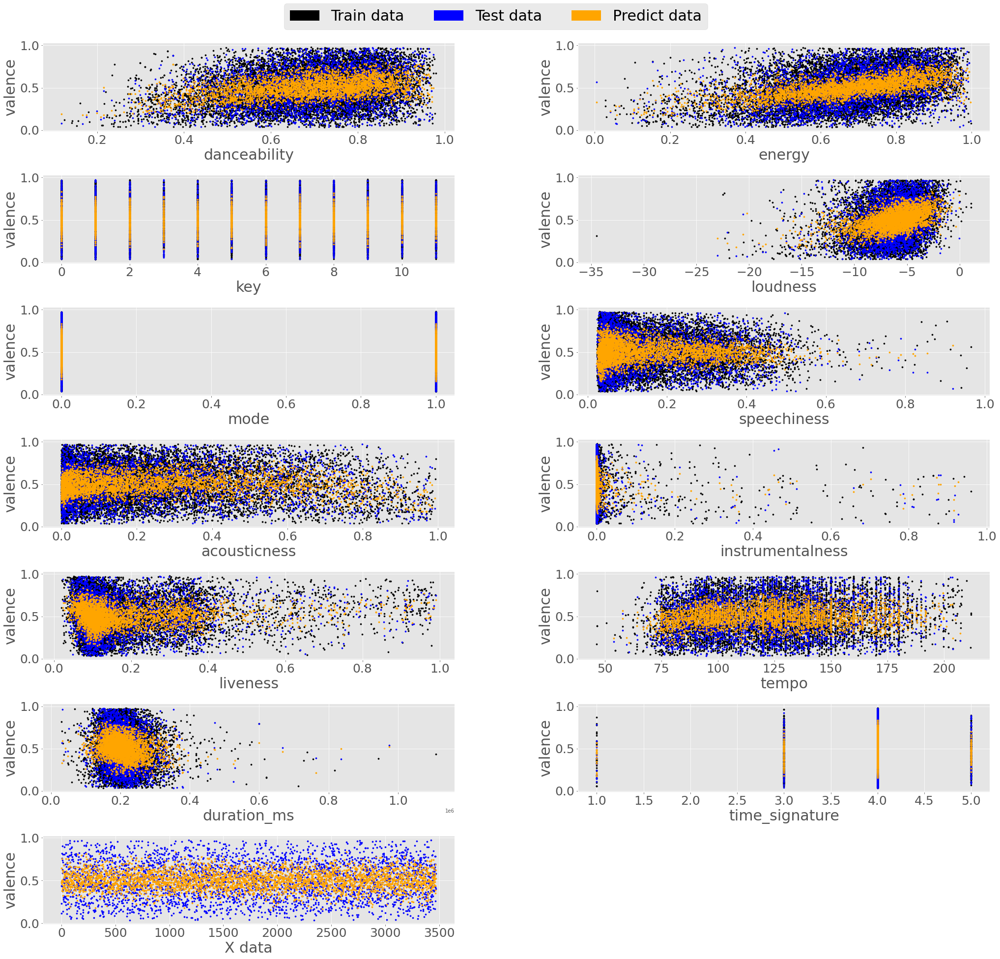

In [18]:
summary_plotter(predicted_valence_w_forest)

In [19]:
importances = forest_model.feature_importances_

In [20]:
std = np.std([tree.feature_importances_ for tree in forest_model.estimators_], axis=0)
indices = np.argsort(importances)[::]

for i in indices:
    print(train_data.columns.drop(['valence'])[i], importances[i])

time_signature 0.002240240218850605
mode 0.005928102080540107
key 0.02700310081159007
instrumentalness 0.04733189846227173
loudness 0.06283059162939467
tempo 0.06673003170408419
duration_ms 0.06965594668469587
speechiness 0.07878477084459998
liveness 0.08307804186833351
acousticness 0.09405275978205306
danceability 0.17098647013005916
energy 0.29137804578352716


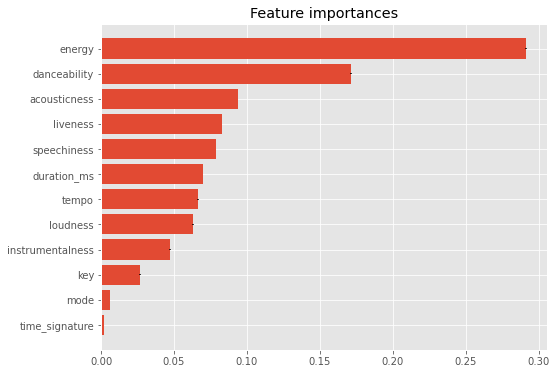

In [21]:
plt.figure(figsize=(8, 6))
plt.title("Feature importances")
plt.barh(range(len(train_data.columns)-1), importances[indices],
        tick_label=[train_data.columns.drop(['valence'])[x] for x in indices],
        yerr=std[indices], align="center")
_ = plt.xticks(rotation=0)

## Support Vector Machine

- Θα συνεχίσουμε με μία διαφορετική προσέγγιση χρησιμοποιώντας μία Μηχανή Διανυσμάτων Στήριξης.


- Όπως και πριν θα αναζητήσουμε τις βέλτιστες τιμές των υπερπαραμέτρων μέσω μιας στοχαστικής αναζήτησης.


- Πρώτα όμως πρέπει να κανονικοποιήσουμε τα δεδομένα εκπαίδευσης. Γι' αυτό το σκοπό θα χρησιμοποιήσουμε τον ``MinMaxScaler``.

In [22]:
# Parameter space
param_grid_svr = [
    {
        "svr__kernel": ["rbf", "poly"], 
        "svr__gamma": ["scale", "auto"], 
        "svr__C": np.logspace(-2.0, 2.0, num=10, dtype='float'),
        "svr__epsilon": np.logspace(-3.0, 0.0, num=10, dtype='float')
    },
    
    {   "svr__kernel": ['linear'], 
        "svr__C": np.logspace(-2.0, 2.0, num=10, dtype='float'),
        "svr__epsilon": np.logspace(-3.0, 0.0, num=10, dtype='float')
    }
]

start_time = time.time()
svr_pipe = Pipeline(steps=[
    ('scaler', MinMaxScaler()),
    ('svr', SVR())
    ]
)

svr_grid_search = RandomizedSearchCV(svr_pipe,
                                  param_distributions=param_grid_svr,
                                  n_iter=30,
                                  scoring='neg_mean_absolute_error',
                                  n_jobs=-1)

svr_grid_search.fit(X_train, y_train)
print('Time elapsed: %.2f seconds' % (time.time() - start_time))

Time elapsed: 553.58 seconds


In [23]:
print(svr_grid_search.best_params_)
print('\n\n')
print(svr_grid_search.best_estimator_)
print('\n\n')
print('Best score:', svr_grid_search.best_score_)

{'svr__kernel': 'rbf', 'svr__gamma': 'scale', 'svr__epsilon': 0.01, 'svr__C': 0.21544346900318834}



Pipeline(steps=[('scaler', MinMaxScaler()),
                ('svr', SVR(C=0.21544346900318834, epsilon=0.01))])



Best score: -0.14785520055521567


In [24]:
# Update the model with the best parameters
svr_pipe.set_params(**svr_grid_search.best_params_)

svr_predict = svr_pipe.fit(X_train, y_train)
predicted_valence_w_svr = svr_pipe.predict(X_test)

score = svr_pipe.score(X_train, y_train)
print("R-squared:", score)

mae = mean_absolute_error(y_test, predicted_valence_w_svr)
print("MAE: ", mae)

R-squared: 0.28476797417847133
MAE:  0.14922588226927663


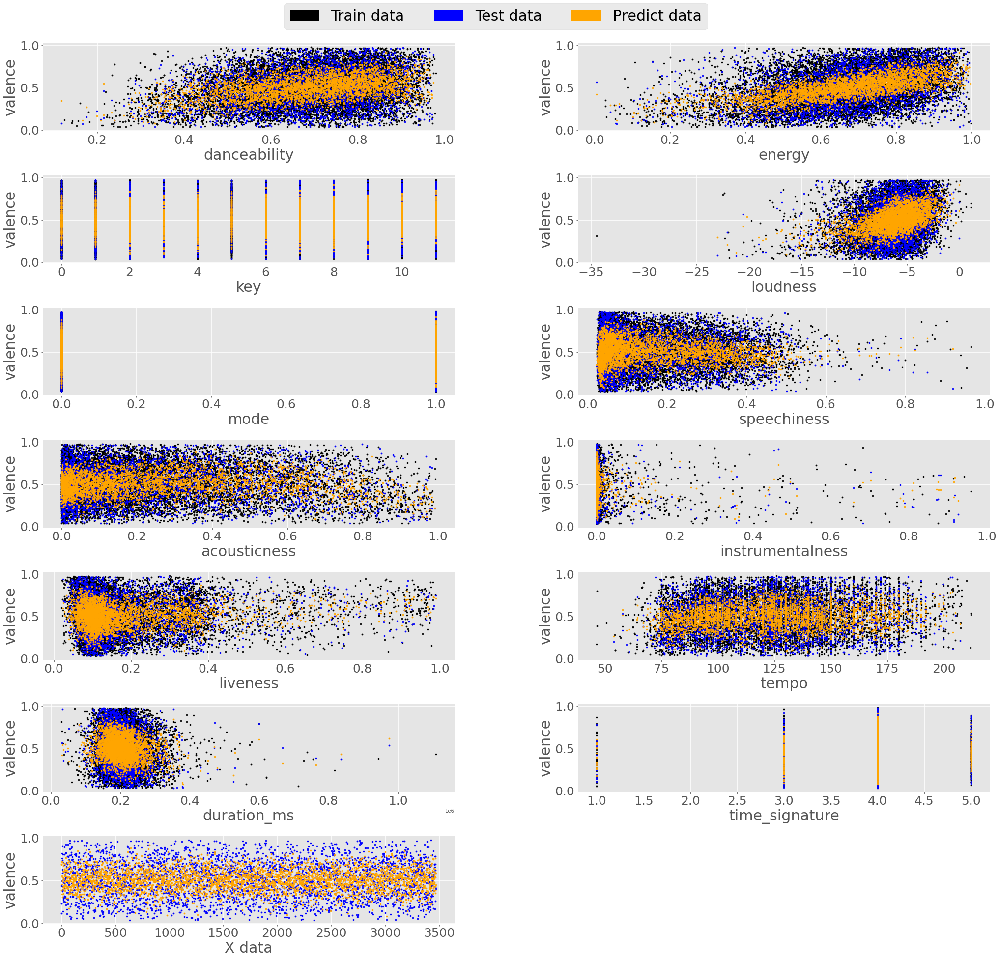

In [25]:
summary_plotter(predicted_valence_w_svr)

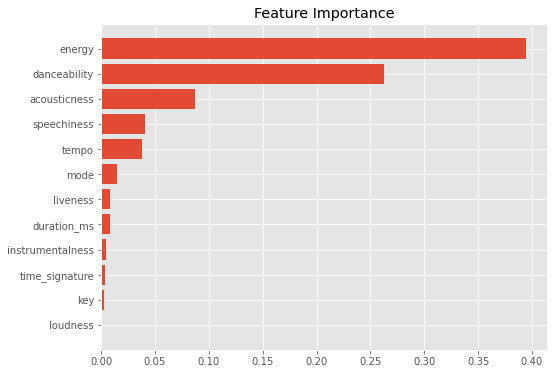

In [26]:
perm_importance = permutation_importance(svr_pipe, X_test, y_test)

feature_names = list(train_data.drop(['valence'],axis=1).columns)
features = np.array(feature_names)

sorted_idx = perm_importance.importances_mean.argsort()

plt.figure(figsize=(8, 6))
plt.title("Feature Importance")
_ = plt.barh(features[sorted_idx], perm_importance.importances_mean[sorted_idx])

## k-Nearest Neighbors

In [27]:
# Parameter space
param_grid_knn = [
    {"knn__n_neighbors": np.linspace(1,100,100, dtype='int'),
     "knn__weights": ['uniform', 'distance'],
     "knn__leaf_size": np.linspace(1,100,100, dtype='int')
    }
]

start_time = time.time()
knn_pipe = Pipeline(steps=[
    ('scaler', MinMaxScaler()),
    ('knn', KNeighborsRegressor())
    ]
)

knn_grid_search = RandomizedSearchCV(knn_pipe,
                                  param_distributions=param_grid_knn,
                                  n_iter=100,
                                  scoring='neg_mean_absolute_error',
                                  n_jobs=-1)

knn_grid_search.fit(X_train, y_train)
print('Time elapsed: %.2f seconds' % (time.time() - start_time))

Time elapsed: 39.74 seconds


In [28]:
print(knn_grid_search.best_params_)
print('\n')
print(knn_grid_search.best_estimator_)
print('\n')
print('Best score:', knn_grid_search.best_score_)

{'knn__weights': 'distance', 'knn__n_neighbors': 15, 'knn__leaf_size': 80}


Pipeline(steps=[('scaler', MinMaxScaler()),
                ('knn',
                 KNeighborsRegressor(leaf_size=80, n_neighbors=15,
                                     weights='distance'))])


Best score: -0.1398476146179817


In [29]:
# Update the model with the best parameters
knn_pipe.set_params(**knn_grid_search.best_params_)

knn_predict = knn_pipe.fit(X_train, y_train)
predicted_valence_w_knn = knn_pipe.predict(X_test)

score = knn_pipe.score(X_train, y_train)
print("R-squared:", score)

mae = mean_absolute_error(y_test, predicted_valence_w_knn)
print("MAE: ", mae)

R-squared: 1.0
MAE:  0.1365800317126652


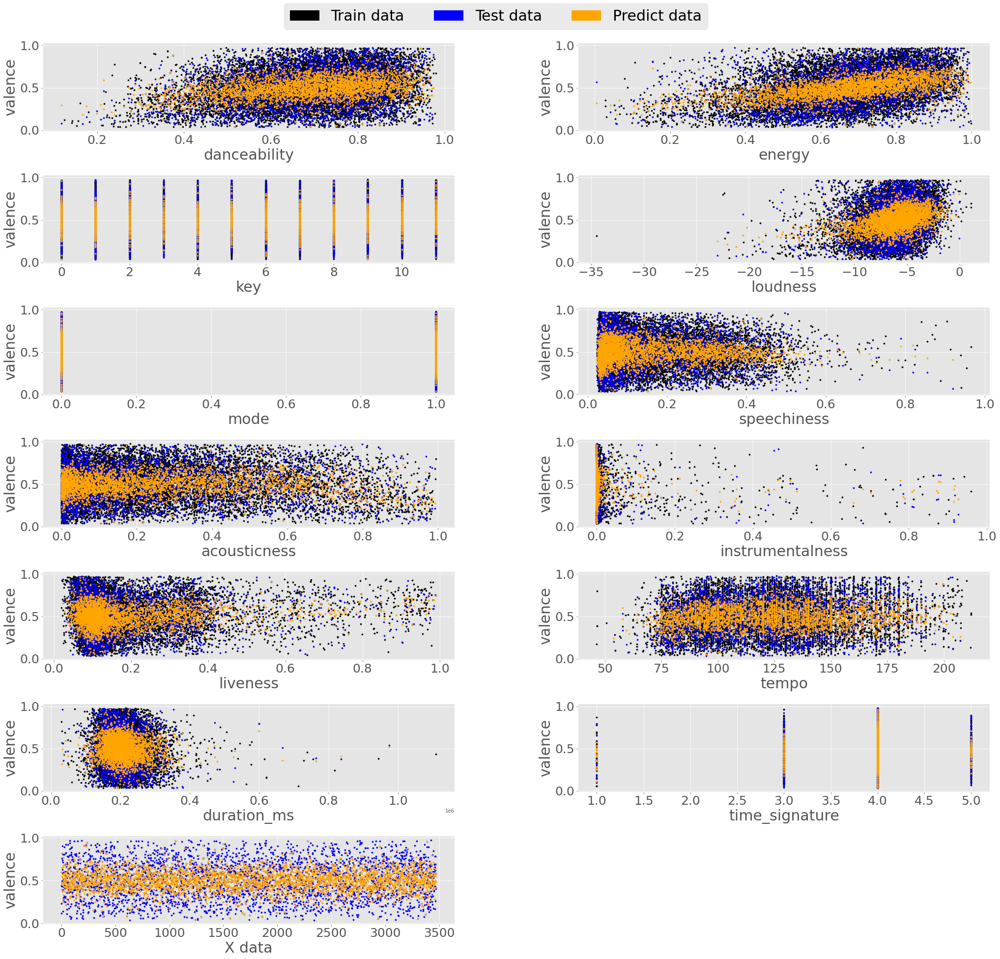

In [30]:
summary_plotter(predicted_valence_w_knn)

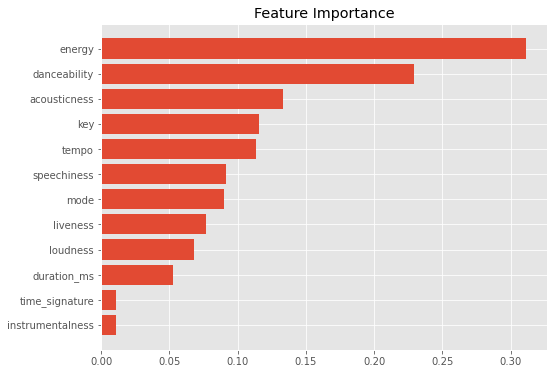

In [31]:
perm_importance = permutation_importance(knn_pipe, X_test, y_test)

feature_names = list(train_data.drop(['valence'],axis=1).columns)
features = np.array(feature_names)

sorted_idx = perm_importance.importances_mean.argsort()

plt.figure(figsize=(8, 6))
plt.title("Feature Importance")
_ = plt.barh(features[sorted_idx], perm_importance.importances_mean[sorted_idx])

- Παρατηρούμε ότι, όπως και στις δύο άλλες προσεγγίσεις (random forest και support vector machine), τα τρία χαρακτηριστικά με τη μεγαλύτερη επιροή στο σθένος ενός κομματιού είναι τα: ``energy``, ``danceability`` και ``acousticness``.



- Η τελευταία προσέγγιση φαίνεται να είναι η καλύτερη οπότε θα τη χρησιμοποιήσουμε για να προβλέψουμε το σθένος κομματιών που δεν ανήκουν σε κανένα από τα σύνολα δεδομένων που χρησιμοποιήσαμε μέχρι στιγμής.

# <center>Ε2: Πρόβλεψη Σθένους με Νευρωνικά Δίκτυα<center>

- Θα ξεκινήσουμε με το να φτιάξουμε δύο σχετικά απλά νευρωνικά δίκτυα χρησιμοποιώντας τυχαίες τιμές υπερπαραμέτρων. Και στα δύο μοντέλα θα παρεμβάλλουμε ένα στρώμα κανονικοποίησης.


- Το πρώτο μοντέλο θα έχει μόνο ένα κρυφό στρώμα με λίγους νευρώνες. Θα επιλέξουμε αυτόν τον αριθμό αυθαίρετα ως τη μέση τιμή μεταξύ των νευρώνων εισόδου και εξόδου.


- Το δεύτερο μοντέλο θα έχει περισσότερα κρυφά στρώματα με περισσότερους νευρώνες. Επιπρόσθετα, σε αυτό το μοντέλο θα θερίζουμε κάποιους από τους νευρώνες με τυχαίο τρόπο. Γι' αυτό το λόγο ο αριθμός τόσο των στρωμάτων όσο και των νευρώνων θα είναι σκόπιμα υπερβολικά μεγάλος για τα δεδομένα του προβλήματος.

In [32]:
tf.random.set_seed(0)

In [33]:
def build_baseline_model(data, tr_label='valence'):
    
    # Check if target label is in data
    if tr_label in list(data.columns):
        data = data.drop([tr_label], axis=1)
        
    
    # Add a normalization layer
    normalizer = layers.Normalization()
    normalizer.adapt(np.array(data))
    
    model = keras.Sequential()
    model.add(normalizer)
    model.add(keras.layers.Dense(6, input_shape=(data.shape[1], ), activation=tf.nn.sigmoid))
    model.add(keras.layers.Dense(1, activation=tf.nn.sigmoid))
    
    return model

def build_regularized_model(data, tr_label='valence'):
    
    # Check if target label is in data
    if tr_label in list(data.columns):
        data = data.drop([tr_label], axis=1)
    
    
    # Add a normalization layer
    normalizer = layers.Normalization()
    normalizer.adapt(np.array(data))
    
    model = keras.Sequential()
    model.add(normalizer)
    model.add(keras.layers.Dense(1024, input_shape=(data.shape[1], ), activation=tf.nn.sigmoid))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(256, activation=tf.nn.sigmoid))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(32, activation=tf.nn.sigmoid))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(1, activation=tf.nn.sigmoid))
    
    return model


def compile_model(model, batch_size=32, lr_schedule=False, lr=0.001, n_rows=None):
    ''' 
    Args:
    
        model:         model to be compiled
        batch_size:    Number of batches used for training
        lr_schedule:   Set to True if you want to use a learning rate
                       schedule
        lr:            learning rate
        n_rows:        Number of rows of the training dataset 
    '''
    
    if lr_schedule:
        steps_per_epoch = n_rows // batch_size
        
        assert n_rows is not None, "if lr_schedule == True, n_rows must be an <int> not None!"
        
        learning_rate = keras.optimizers.schedules.InverseTimeDecay(
            lr,
            decay_steps=steps_per_epoch * 10,
            decay_rate=1,
            staircase=False
            )
    else:
        learning_rate = lr
    
    
    model.compile(loss='mean_squared_error',
                optimizer=optimizers.Adam(learning_rate),
                metrics=['mean_absolute_error'])

In [34]:
num_epochs = 100
batch_size = 128

dnn_base_model = build_baseline_model(X_train)
compile_model(dnn_base_model, batch_size=batch_size, lr_schedule=True, n_rows=X_train.shape[0])

dnn_regularized_model = build_regularized_model(X_train)
compile_model(dnn_regularized_model, batch_size=batch_size, lr_schedule=True, n_rows=X_train.shape[0])

In [35]:
dnn_base_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 12)               25        
 n)                                                              
                                                                 
 dense (Dense)               (None, 6)                 78        
                                                                 
 dense_1 (Dense)             (None, 1)                 7         
                                                                 
Total params: 110
Trainable params: 85
Non-trainable params: 25
_________________________________________________________________


In [36]:
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

history_base_model = dnn_base_model.fit(
    X_train, 
    y_train,
    epochs=num_epochs, 
    validation_split=0.2,
    verbose=0,
    batch_size=batch_size,
    callbacks=[early_stop])

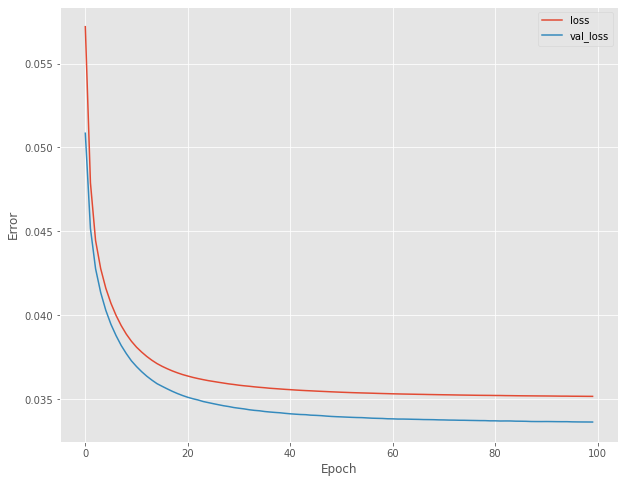

In [37]:
plot_loss(history_base_model)

In [38]:
dnn_regularized_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_1 (Normalizat  (None, 12)               25        
 ion)                                                            
                                                                 
 dense_2 (Dense)             (None, 1024)              13312     
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_3 (Dense)             (None, 256)               262400    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_4 (Dense)             (None, 32)                8224      
                                                      

In [39]:
history_regularized_model = dnn_regularized_model.fit(
    X_train, 
    y_train,
    epochs=num_epochs, 
    validation_split=0.2,
    verbose=0,
    batch_size=batch_size,
    callbacks=[early_stop])

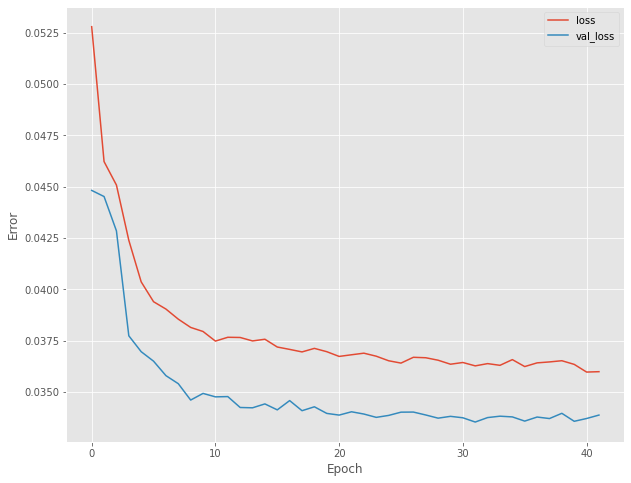

In [40]:
plot_loss(history_regularized_model)

In [41]:
dnn_base_model.evaluate(X_test, y_test)

109/109 [==============================] - 0s 1ms/step - loss: 0.0354 - mean_absolute_error: 0.1534


[0.03535952791571617, 0.15341049432754517]

In [42]:
dnn_regularized_model.evaluate(X_test, y_test)

109/109 [==============================] - 0s 1ms/step - loss: 0.0358 - mean_absolute_error: 0.1551


[0.0358109287917614, 0.15511545538902283]

- Παρατηρούμε ότι και στις δύο περιπτώσεις το σφάλμα στην επικύρωση είναι μικρότερο από το σφάλμα της εκπαίδευσης. Αυτό μπορεί να οφείλεται στο ότι ο διαμερισμός των δεδομένων σε δεδομένα εκπαίδευσης και ελέγχου έγινε με τέτοιο τρόπο ώστε τα δεδομένα εκπαίδευσης να περιέχουν πιο "δύσκολα" χαρακτηριστικά για το μοντέλο της παλινδρόμησης.

## Εύρεση βέλτιστων τιμών υπερπαραμέτρων

- Τόσο ο αριθμός των στρωμάτων από τα οποία θα αποτελείται το νευρωνικό δίκτυο, όσο και ο αριθμός των νευρώνων σε κάθε στρώμα του νευρωνικού δικτύου αποτελούν υπερπαραμέτρους που πρέπει να ορίσουμε.



- Για την εύρεση του καλύτερου συνδυασμού θα χρησιμοποιήσουμε τη βιβλιοθήκη ``keras_tuner`` που μας επιτρέπει να ορίσουμε ένα χώρο αναζήτησης υπερπαραμέτρων.


- Θα αναζητήσουμε τη βέλτιστη αρχιτεκτονική του μοντέλου βάσει τον αριθμό στρωμάτων, αριθμό νευρώνων σε κάθε στρώμα, συνάρτηση ενεργοποίησης, ύπαρξη ή μη θερισμού νευρώνων και ρυθμό εκμάθησης.

In [43]:
try:
    import keras_tuner as kt
except ImportError:
    !pip install keras-tuner
    import keras_tuner as kt

In [44]:
def build_general_model(hp, data=X_train, tr_label='valence'):
    '''
    Build and tune model architecture.
    '''
    
    # Check if target label is in data
    if tr_label in list(data.columns):
        data = data.drop([tr_label], axis=1)
    
    # Add a normalization layer
    normalizer = layers.Normalization()
    normalizer.adapt(np.array(data))
    
    model = keras.Sequential()
    model.add(normalizer)
    
    # Tune the number of layers.
    for i in range(hp.Int("num_layers", min_value=1, max_value=3, step=1)):
        model.add(
            keras.layers.Dense(
                # Tune number of units separately.
                units=hp.Int(f"units_{i}", min_value=1, max_value=512, step=31),
                activation=hp.Choice("activation", ["sigmoid", "elu", "tanh", "relu"])
            )
        )
    
    if hp.Boolean("dropout", default=True):
        model.add(keras.layers.Dropout(rate=hp.Float('drop_rate',
                                                     min_value=0.1, max_value=0.9,
                                                     step=0.1)
            )
        )
    
    # One outpout between 0 and 1
    output_activation = hp.Choice('out_layer_activation_fn', ['sigmoid', 'elu', 'relu', 'tanh', 'None'])
    if output_activation == 'None':
        model.add(keras.layers.Dense(1, activation=None))
    else:
        model.add(keras.layers.Dense(1, activation=output_activation))
        
    
    # Compiling the model
    learning_rate = hp.Float("lr", min_value=1e-4, max_value=1e-2, sampling="log")
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
        loss="mean_squared_error",
        metrics=["mean_absolute_error"],
    )
    
    return model


hp = kt.HyperParameters()
build_general_model(kt.HyperParameters())

In [45]:
# Initialize the tuner
tuner = kt.RandomSearch(
    hypermodel=build_general_model,
    # objective=kt.Objective("val_mean_absolute_error", direction="min"),
    objective='val_loss',
    max_trials=30,
    executions_per_trial=5,
    overwrite=True,
    directory="tuner",
    project_name="hyperparameters_tuning",
)

In [46]:
tuner.search_space_summary()

Search space summary
Default search space size: 7
num_layers (Int)
{'default': None, 'conditions': [], 'min_value': 1, 'max_value': 3, 'step': 1, 'sampling': None}
units_0 (Int)
{'default': None, 'conditions': [], 'min_value': 1, 'max_value': 512, 'step': 31, 'sampling': None}
activation (Choice)
{'default': 'sigmoid', 'conditions': [], 'values': ['sigmoid', 'elu', 'tanh', 'relu'], 'ordered': False}
dropout (Boolean)
{'default': True, 'conditions': []}
drop_rate (Float)
{'default': 0.1, 'conditions': [], 'min_value': 0.1, 'max_value': 0.9, 'step': 0.1, 'sampling': None}
out_layer_activation_fn (Choice)
{'default': 'sigmoid', 'conditions': [], 'values': ['sigmoid', 'elu', 'relu', 'tanh', 'None'], 'ordered': False}
lr (Float)
{'default': 0.0001, 'conditions': [], 'min_value': 0.0001, 'max_value': 0.01, 'step': None, 'sampling': 'log'}


In [47]:
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

start_time = time.time()

tuner.search(X_train, y_train, epochs=100, validation_data=(X_test, y_test), callbacks=[early_stop])

print('\n')
print('Time elapsed: %.2f seconds' % (time.time() - start_time))

Trial 30 Complete [00h 01m 13s]
val_loss: 0.03493069931864738

Best val_loss So Far: 0.03266650959849358
Total elapsed time: 00h 58m 21s
INFO:tensorflow:Oracle triggered exit


Time elapsed: 3501.95 seconds


In [48]:
# Get a summary of the best trial
tuner.results_summary(1)

Results summary
Results in tuner/hyperparameters_tuning
Showing 1 best trials
Trial summary
Hyperparameters:
num_layers: 2
units_0: 280
activation: relu
dropout: True
drop_rate: 0.2
out_layer_activation_fn: elu
lr: 0.0005200653565524559
units_1: 125
Score: 0.03266650959849358


In [49]:
# Get the top 10 hyperparameters.
best_hps = tuner.get_best_hyperparameters(20)

# Build the model with the best hp.
model = build_general_model(best_hps[0], data=X_train)

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_1 (Normalizat  (None, 12)               25        
 ion)                                                            
                                                                 
 dense_3 (Dense)             (None, 280)               3640      
                                                                 
 dense_4 (Dense)             (None, 125)               35125     
                                                                 
 dropout (Dropout)           (None, 125)               0         
                                                                 
 dense_5 (Dense)             (None, 1)                 126       
                                                                 
Total params: 38,916
Trainable params: 38,891
Non-trainable params: 25
_________________________________________________

In [50]:
# Fit with training dataset.
model.fit(x=X_train, y=y_train, epochs=50, shuffle=True)

Epoch 1/50
326/326 [==============================] - 1s 1ms/step - loss: 0.0512 - mean_absolute_error: 0.1775
Epoch 2/50
326/326 [==============================] - 0s 1ms/step - loss: 0.0383 - mean_absolute_error: 0.1578
Epoch 3/50
326/326 [==============================] - 0s 1ms/step - loss: 0.0357 - mean_absolute_error: 0.1523
Epoch 4/50
326/326 [==============================] - 0s 1ms/step - loss: 0.0345 - mean_absolute_error: 0.1498
Epoch 5/50
326/326 [==============================] - 0s 1ms/step - loss: 0.0339 - mean_absolute_error: 0.1486
Epoch 6/50
326/326 [==============================] - 1s 2ms/step - loss: 0.0333 - mean_absolute_error: 0.1476
Epoch 7/50
326/326 [==============================] - 0s 1ms/step - loss: 0.0328 - mean_absolute_error: 0.1462
Epoch 8/50
326/326 [==============================] - 0s 1ms/step - loss: 0.0319 - mean_absolute_error: 0.1438
Epoch 9/50
326/326 [==============================] - 0s 1ms/step - loss: 0.0320 - mean_absolute_error: 0.1438
E

In [51]:
y_pred_test = model.predict(X_test)

In [52]:
mae = mean_absolute_error(y_test, y_pred_test)
print("MAE: ", mae)

MAE:  0.14809268088520774


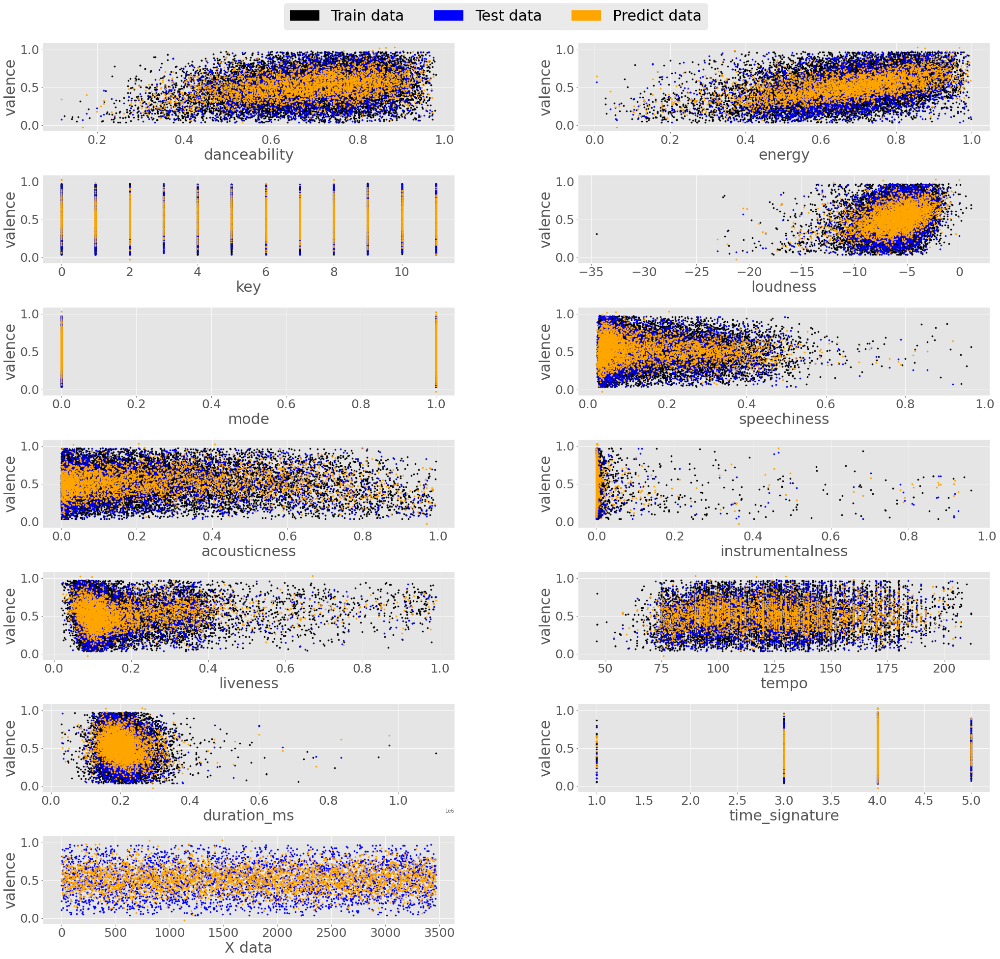

In [53]:
summary_plotter(yPredictData=y_pred_test,
               xTest=X_test, yTest=y_test)

- Στη συνέχεια, θα χρησιμοποιήσουμε τις τιμές αυτές των υπερπαραμέτρων για να εκπαιδεύσουμε το μοντέλο μας στο σύνολο των δεδομένων και θα το εφαρμόσουμε σε νέα δεδομένα.

# <center>Εφαρμογή σε νέα δεδομένα<center>

- Αρχικά θα διαβάσουμε τα δεδομένα μας, τα οποία έχουμε ήδη κατεβάσει από το spotify και τα έχουμε αποθηκεύσει στο αρχείο ``spotify_data.csv``.



- Στη συνέχεια θα εκπαιδεύσουμε τα μοντέλα σε όλο το σύνολο των αρχικών δεδομένων, χωρίς να τα διαχωρίσουμε σε δεδομένα εκπαίδευσης και ελέγχου, χρησιμοποιώντας τις βέλτιστες τιμές (υπερ-) παραμέτρων που έχουμε βρει.



- Για την περίπτωση των μεθόδων μηχανικής μάθησης πλην νευρωνικών δικτύων, θα κάνουμε χρήση του μοντέλου ``k-nearest neighbors``.

In [54]:
# Unseen data
spotify_data = pd.read_csv('spotify_data.csv')
spotify_data = spotify_data.drop(columns=['type', 'song_id', 'uri',
                                     'track_href', 'analysis_url'], axis=1)


x = spotify_data.drop(['valence'], axis=1)
y_true = spotify_data.valence

# Scale new data
x_scaled = scaler.transform(x)
x_scaled = pd.DataFrame(x_scaled, columns=x.columns)

# Scale original data to train
# again the rf/svr/knn regressor
X_scaled = scaler.transform(train_data.drop(['valence'], axis=1))
X_scaled = pd.DataFrame(X_scaled, columns=train_data.drop(['valence'], axis=1).columns)

## Εφαρμογή με τη μέθοδο Random Forest

In [55]:
# Retrain the best model using the whole dataset
rf_rgr = forest_grid_search.best_estimator_
rf_rgr.set_params(**forest_grid_search.best_params_)
rf_rgr.fit(X_scaled, train_data.valence)

y_pred = rf_rgr.predict(x_scaled)

In [56]:
mae = mean_absolute_error(y_true, y_pred)
print("MAE: ", mae)

MAE:  0.14629118532591484


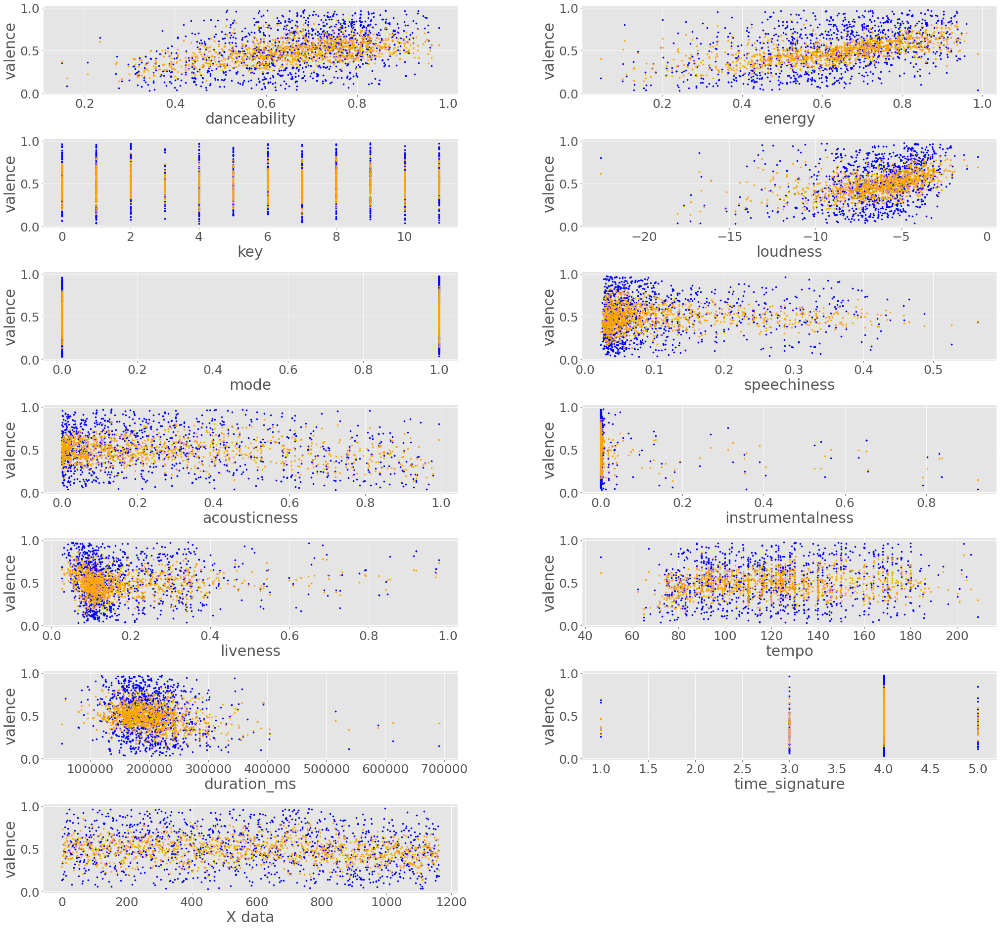

In [57]:
# Blue marks: Truth value for valence
# Orange markes: Predicted valence using 
#                an RF approach
summary_plotter(yPredictData=y_pred,
               xTest=x, yTest=y_true,
               show_train=False,
               show_legend=False)

## Εφαρμογή με τη μέθοδο Support Vector Machine

In [58]:
# Retrain the best model using the whole dataset
svr_rgr = svr_grid_search.best_estimator_
svr_rgr.set_params(**svr_grid_search.best_params_)
svr_rgr.fit(X_scaled, train_data.valence)

y_pred = svr_rgr.predict(x_scaled)

In [59]:
mae = mean_absolute_error(y_true, y_pred)
print("MAE: ", mae)

MAE:  0.15323189265616505


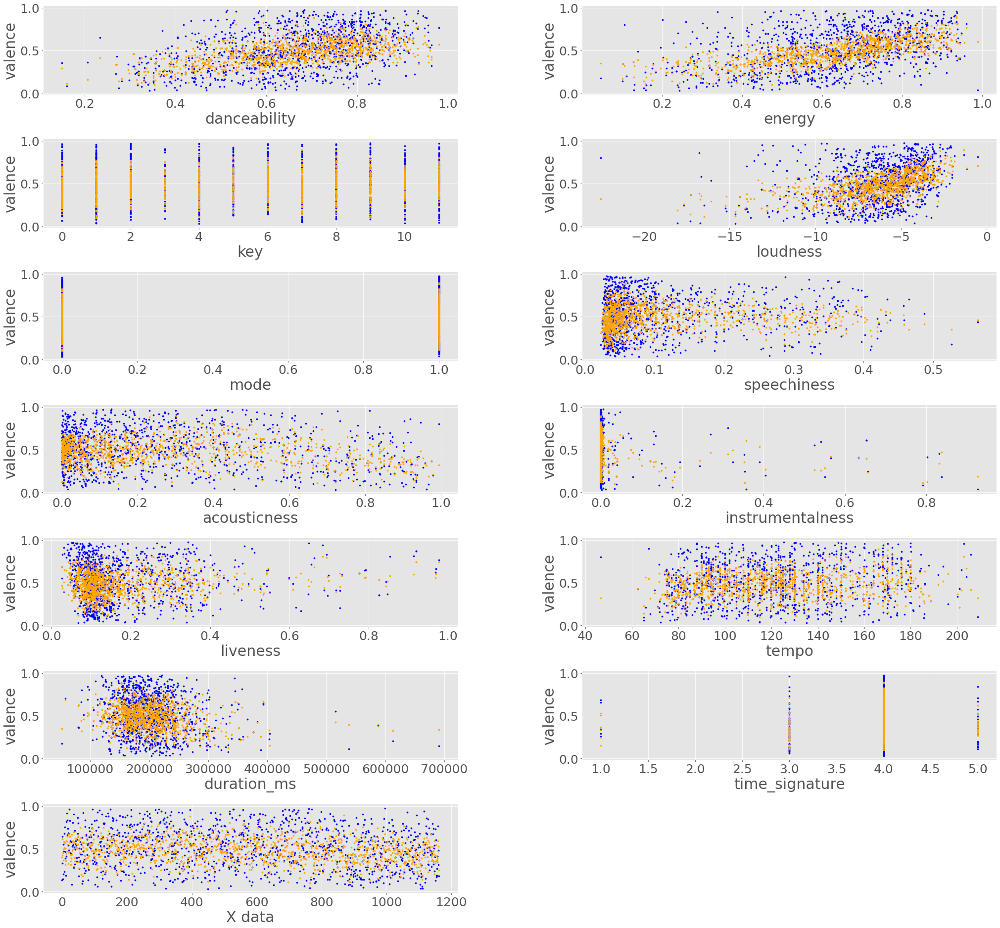

In [60]:
# Blue marks: Truth value for valence
# Orange markes: Predicted valence using 
#                an RF approach
summary_plotter(yPredictData=y_pred,
               xTest=x, yTest=y_true,
               show_train=False,
               show_legend=False)

## Εφαρμογή με τη μέθοδο k-Nearest Neighbors

In [61]:
# Retrain the best model using the whole dataset
knn_rgr = knn_grid_search.best_estimator_
knn_rgr.set_params(**knn_grid_search.best_params_)
knn_rgr.fit(X_scaled, train_data.valence)

y_pred = knn_rgr.predict(x_scaled)

In [62]:
mae = mean_absolute_error(y_true, y_pred)
print("MAE: ", mae)

MAE:  0.14228244085699493


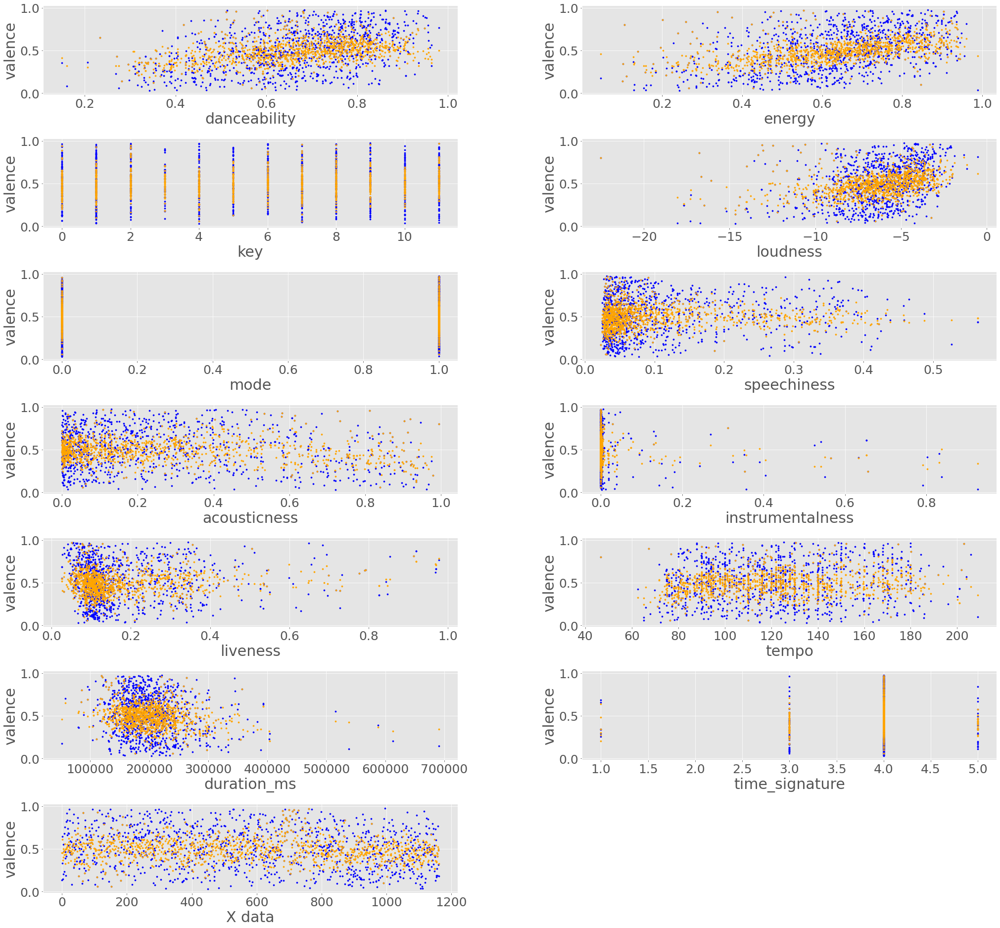

In [63]:
# Blue marks: Truth value for valence
# Orange markes: Predicted valence using 
#                an RF approach
summary_plotter(yPredictData=y_pred,
               xTest=x, yTest=y_true,
               show_train=False,
               show_legend=False)

## Εφαρμογή με νευρωνικά δίκτυα

In [64]:
# Retrain the model
# Get the top 10 hyperparameters.
best_hps = tuner.get_best_hyperparameters(10)

# Build the model with the best hp.
model = build_general_model(best_hps[0], data=train_data)

model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_2 (Normalizat  (None, 12)               25        
 ion)                                                            
                                                                 
 dense_6 (Dense)             (None, 280)               3640      
                                                                 
 dense_7 (Dense)             (None, 125)               35125     
                                                                 
 dropout_1 (Dropout)         (None, 125)               0         
                                                                 
 dense_8 (Dense)             (None, 1)                 126       
                                                                 
Total params: 38,916
Trainable params: 38,891
Non-trainable params: 25
_________________________________________________

In [65]:
# Fit with the entire dataset.
model.fit(x=train_data.drop(['valence'],axis=1), y=train_data.valence, epochs=50, shuffle=True)

Epoch 1/50
434/434 [==============================] - 1s 1ms/step - loss: 0.0492 - mean_absolute_error: 0.1749
Epoch 2/50
434/434 [==============================] - 1s 1ms/step - loss: 0.0374 - mean_absolute_error: 0.1564
Epoch 3/50
434/434 [==============================] - 1s 1ms/step - loss: 0.0357 - mean_absolute_error: 0.1526
Epoch 4/50
434/434 [==============================] - 1s 1ms/step - loss: 0.0347 - mean_absolute_error: 0.1505
Epoch 5/50
434/434 [==============================] - 1s 1ms/step - loss: 0.0338 - mean_absolute_error: 0.1483
Epoch 6/50
434/434 [==============================] - 1s 1ms/step - loss: 0.0331 - mean_absolute_error: 0.1469
Epoch 7/50
434/434 [==============================] - 1s 1ms/step - loss: 0.0327 - mean_absolute_error: 0.1463
Epoch 8/50
434/434 [==============================] - 1s 1ms/step - loss: 0.0320 - mean_absolute_error: 0.1446
Epoch 9/50
434/434 [==============================] - 1s 1ms/step - loss: 0.0317 - mean_absolute_error: 0.1437
E

In [66]:
y_pred = model.predict(x)

mae = mean_absolute_error(y_true, y_pred)
print("MAE: ", mae)

MAE:  0.14991009710785033


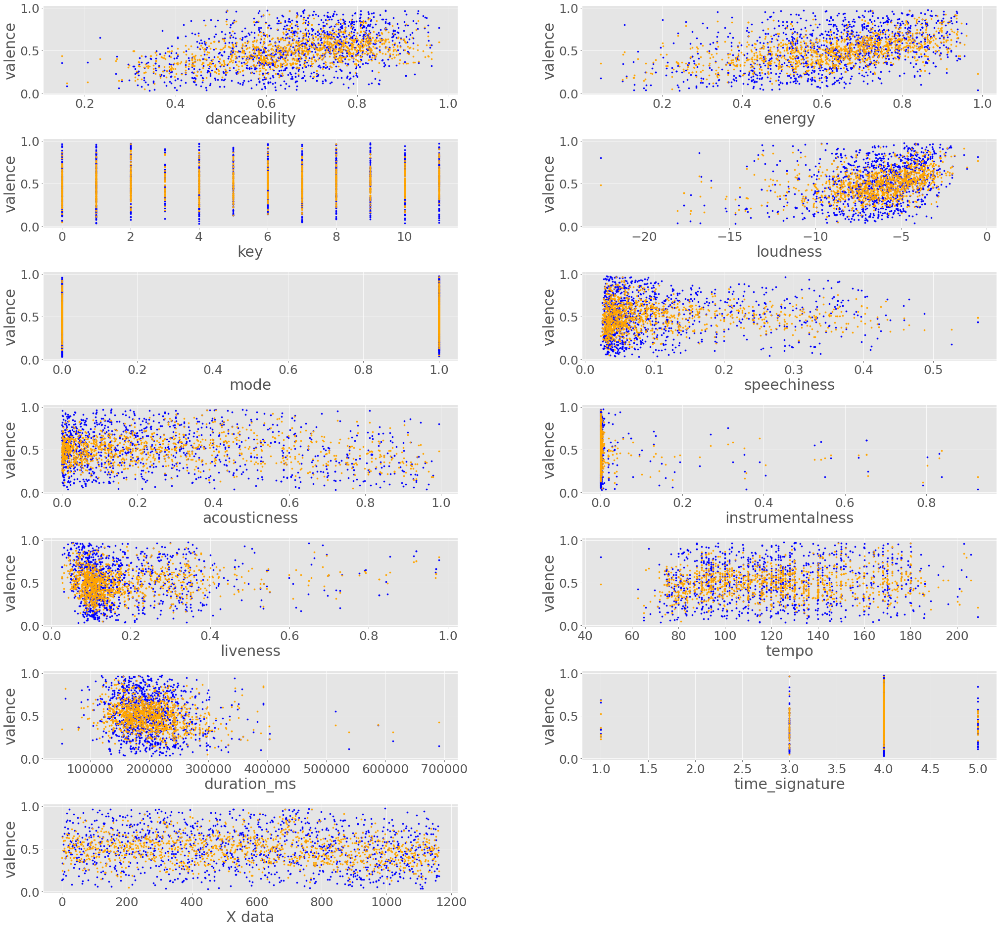

In [67]:
# Blue marks: Truth value for valence
# Orange markes: Predicted valence using 
#                an RF approach
summary_plotter(yPredictData=y_pred,
               xTest=x, yTest=y_true,
               show_train=False,
               show_legend=False)

### Συμπεράσματα

- Βασισμένοι στις τιμές του Μέσου Απόλυτου Λάθους (ΜΑΛ) παρατηρούμε ότι όλες οι προσεγγίσεις που δοκιμάσαμε δίνουν παρόμοια αποτελέσματα.



- Η προσέγγιση που σημείωσε τη χαμηλότερη τιμή ΜΑΛ όταν εφαρμόστηκε στα νέα δεδομένα ήταν η μέθοδος επιτηρούμενης μηχανικής μάθησης k-Nearest Neighbors.



- Λαμβάνοντας υπόψιν επιπρόσθετους παράγοντες όπως η πολυπλοκότητα και ο χρόνος εκπαίδευσης καταλήγουμε στο συμπέρασμα ότι γι' αυτό το σύνολο δεδομένων (και γι' αυτές τις τιμές των υπερπαραμέτρων), η πιο αποδοτική προσέγγιση ήταν μέσω της μεθόδου k-Nearest Neighbors.



- Πιθανές αστοχίες οφείλονται σε ελλειπή προεπεξεργασία των δεδομένων που μπορεί να επηρέασαν σημαντικά την αναζήτηση των βέλτιστων υπερπαραμέτρων.